# Movie reviews Classification

<img src="https://frenzy86.s3.eu-west-2.amazonaws.com/python/nlp/rev.png" width="1200">



In [17]:
import numpy as np
import pandas as pd
import re
from sklearn.datasets import load_files

import warnings
warnings.filterwarnings('ignore')

In [18]:
!wget https://frenzy86.s3.eu-west-2.amazonaws.com/python/nlp/txt_sentoken.zip 
#scarica la cartella e installa quella zippata nella stessa cartella del notebook, poi estrai i file da winrar con estrai qui

"wget" non � riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.


In [19]:
!unzip txt_sentoken.zip

"unzip" non � riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.


In [20]:
movie_data = load_files(r"txt_sentoken")
X_, y = movie_data.data, movie_data.target
'''La riga di codice indica che si sta caricando un dataset di file di testo (txt_sentoken) nella variabile movie_data. 
La funzione load_files carica tutti i file presenti all'interno della directory specificata come parametro e restituisce una 
struttura dati contenente i dati dei file classificati in base alle sottodirectory presenti all'interno della directory. 
In questo caso, verranno caricati tutti i file di testo presenti all'interno della sottodirectory "txt_sentoken".

La lettera "r" è un prefisso che indica una stringa "grezza" o "non elaborata" (raw string, in inglese). Questo significa che gli 
eventuali caratteri di escape presenti nella stringa (come ad esempio il carattere di backslash "\" ) vengono ignorati e considerati 
come caratteri normali. Questo è utile per evitare problemi con sequenze di escape accidentali o indesiderate. Nell'esempio di codice
proposto, la lettera "r" indica che la stringa di input deve essere trattata come una stringa grezza.
La riga di codice sopra assegna i valori dell'attributo "data" dell'oggetto "movie_data" alla variabile X_ e i valori dell'attributo 
"target" all'oggetto "y". Questo suggerisce che l'oggetto "movie_data" contiene dati relativi a film e che i valori di "data" 
rappresentano le caratteristiche dei film mentre i valori di "target" rappresentano la variabile di output da prevedere.'''

In [21]:
unique, counts = np.unique(y, return_counts=True)

print(np.asarray((unique, counts)).T)

'''La funzione numpy.unique() restituisce un array con tutti gli elementi unici dell'array y, senza ripetizioni. 
Il secondo parametro, return_counts=True, serve anche a restituire il numero di volte che ogni elemento unico appare nell'array y. 
Insieme, unique e counts formano una coppia di valori restituiti.
La parte di codice print(np.asarray((unique, counts)).T) trasforma le due liste di dati "unique" e "counts" in un array numpy e quindi 
transpone l'array. Questo significa che l'array risultante ha tutte le coppie di valori di "unique" e "counts" in righe separate e in 
due colonne. Viene quindi stampato l'array ottenuto.'''

[[  0 999]
 [  1 414]]


In [22]:
X_

[b'lisa cholodenko\'s " high art , " is an intelligent , quiet drama . \nits strongest quality , aside from the top-notch central performances , is the perceptive way in which the film , also written by cholodenko , observes its characters . \nthey are all flawed people , some more troubled than others , but they are not judged . \njudging the characters in this picture would be a creative misstep on the filmmakers\' parts , because no one , no matter how bad off they are , deserve to be negatively judged if they are involved in some serious problems that they cannot break free of . \nsyd ( radha mitchell ) , a 24-year-old woman living with her longtime boyfriend james ( gabriel mann ) , has recently been awarded an ideal job at the high-profile photography magazine , " frame . " \nshe very much enjoys where her career is headed , but is often not taken very seriously by her managers , who are always giving her petty jobs to do , when she knows she could be doing more important things 

In [23]:
# List of regex patterns for symbols
patterns = [
            r'\d+',      # rimuove digits (numeri)
            r'[^\w\s]',  # Remove punteggiatura e simboli ...,'@!£$%
            r'\b\w{1,2}\b',#remove all token less than2 characters
            r'(http|www)[^\s]+', # remove website
            r'\s+'
            ] 


''' La regex r'[^\w\s]' indica qualsiasi carattere che non sia una lettera, un numero, un underscore (_), uno spazio o un carattere
              di tabulazione. In altre parole, corrisponde a tutti i simboli di interpunzione e simili.
              r'[!@#$%<.*?>]+', 
    r'[^\w\s]',Remove simbols Remove HTML tags/markups- è un'espressione regolare che cerca qualsiasi carattere nella stringa che 
            corrisponda a uno dei seguenti simboli: !, @, #, $, %, <, >, ., *, ?, o +. In altre parole, cerca stringhe che contengono almeno uno di questi
            simboli. Questa espressione regolare può essere utilizzata per la validazione di password o altri campi di input che richiedono un certo grado
            di complessità. 
    r'\s+s\s+',  # Remove rimuove tutte le occorrenze di una o più lettere "s" circondate da uno o più spazi bianchi in entrambi i lati. Per essere più 
            precisi, la stringa corrisponde a: \s+ : uno o più spazi bianchi     s : la lettera "s"            \s+ : uno o più spazi bianchi 
            In pratica, questa espressione regolare potrebbe trovare sequenze del tipo: " s ", " s ", " s " e così via. Ad esempio, si può usare quest'
            espressione regolare in Python insieme alla funzione re.findall() per trovare tutte le occorrenze della sequenza di caratteri sopra menzionata
             n una stringa
    r'\b\w{1,2}\b',#remove all token less than2 characters. Questa espressione regolare rappresenta un pattern che corrisponde a tutte le parole composte 
            da uno o due caratteri, che appaiono all'interno di uno spazio bianco o all'inizio/fine di una stringa. 
              Più precisamente:
              - `\b` indica un confine di parola, ovvero un punto in cui il carattere precedente è un non-word character (es. uno spazio bianco o una 
              punteggiatura) e quello successivo è un word character (es. una lettera, un numero o un underscore)
              - `\w{1,2}` indica una serie di uno o due caratteri alfanumerici o underscore (ovvero rappresenta uno o due caratteri di una parola)
              - `\b` indica di nuovo il confine di parola
              Ad esempio, questa espressione regolare potrebbe trovare corrispondenza con le parole "a", "am" o "to" in una frase, ma non con le parole
                "the" o "and".
    r'\s+',    #Remove extra space and tabs '\s' indica uno spazio bianco (come uno spazio, una tabulazione o un ritorno a capo) e il simbolo '+' 
                        #indica la ripetizione una o più volte del carattere precedente.'''
            
# Define a function to clean symbols using regex
def clean_symbols(item):
    cleaned_item = item.decode('utf-8')  # Convert byte string to regular string
    for pattern in patterns:
        cleaned_item = re.sub(pattern, ' ', cleaned_item)
    return cleaned_item.lower()
'''Questa è una funzione che prende in input una stringa (called "item") e la "pulisce" da alcuni caratteri o sequenze di caratteri indesiderati (dettagliati
 in una lista chiamata "patterns"). Il primo passo è convertire la stringa in una stringa regolare ("cleaned_item") usando il metodo "decode" con l'encoding 
 "utf-8". Questo è utile soprattutto quando la stringa in input è una stringa di byte.
In seguito, la funzione esegue un ciclo "for" to iterate through each pattern in the list "patterns" e utilizza il modulo "re" (che significa "regular
 expression") per sostituire ogni occorrenza del pattern con uno spazio vuoto nella stringa "cleaned_item".
In altre parole, la funzione cerca ogni sequenza di caratteri che corrisponde ai pattern specificati in "patterns" e le sostituisce con uno spazio vuoto (" ") nella stringa "cleaned_item". Ciò significa che tutti i caratteri indesiderati verranno rimossi e sostituiti con uno spazio vuoto.
Infine, la funzione restituisce la versione "pulita" della stringa in minuscolo ("cleaned_item").'''

# Apply the function to each element in the list
list(map(clean_symbols, X_))
'''Questa è una funzione in Python che applica la funzione "clean_symbols" ad ogni elemento della lista "X_". La funzione "clean_symbols" utilizata per 
eliminare simboli indesiderati o caratteri speciali dall'input. La funzione "map" viene utilizzata per applicare la funzione "clean_symbols" all'intera lista
 "X_" e restituire una nuova lista contenente gli elementi modificati. Infine, questa nuova lista viene convertita in un oggetto di tipo "list" grazie alla 
 funzione "list".'''

['lisa cholodenko high art intelligent quiet drama its strongest quality aside from the top notch central performances the perceptive way which the film also written cholodenko observes its characters they are all flawed people some more troubled than others but they are not judged judging the characters this picture would creative misstep the filmmakers parts because one matter how bad off they are deserve negatively judged they are involved some serious problems that they cannot break free syd radha mitchell year old woman living with her longtime boyfriend james gabriel mann has recently been awarded ideal job the high profile photography magazine frame she very much enjoys where her career headed but often not taken very seriously her managers who are always giving her petty jobs when she knows she could doing more important things one night while taking bath syd notices leak coming from the apartment above hers when she goes there inform them she meets lucy beliner ally sheedy thi

In [24]:
X = list(map(clean_symbols, X_)) #assegno la lsita di elementi puliti alla nuova variabile X_
X

['lisa cholodenko high art intelligent quiet drama its strongest quality aside from the top notch central performances the perceptive way which the film also written cholodenko observes its characters they are all flawed people some more troubled than others but they are not judged judging the characters this picture would creative misstep the filmmakers parts because one matter how bad off they are deserve negatively judged they are involved some serious problems that they cannot break free syd radha mitchell year old woman living with her longtime boyfriend james gabriel mann has recently been awarded ideal job the high profile photography magazine frame she very much enjoys where her career headed but often not taken very seriously her managers who are always giving her petty jobs when she knows she could doing more important things one night while taking bath syd notices leak coming from the apartment above hers when she goes there inform them she meets lucy beliner ally sheedy thi

In [25]:
text = ''.join(X)
'''Questa istruzione prende una lista di elementi di tipo stringa chiamata X_ e li unisce in una singola stringa di caratteri, utilizzando 
un carattere vuoto come delimitatore tra ogni elemento. In pratica, se X_ fosse ["ciao", "come", "stai"], la chiamata a ''.join(X_) produrrebbe la stringa 
'ciaocometstai'.'''

### Wordcloud

(-0.5, 799.5, 399.5, -0.5)

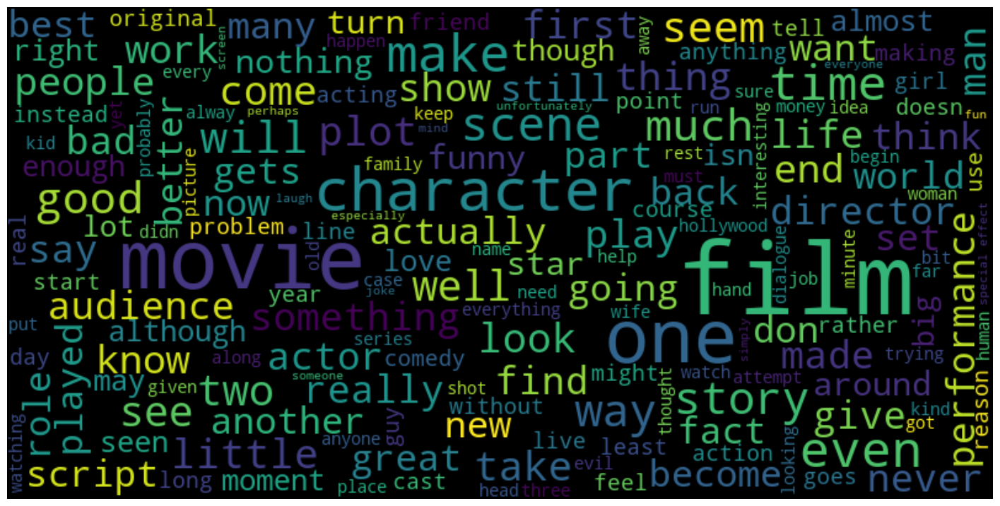

In [26]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

wordcloud = WordCloud(background_color = 'black', width = 800, height = 400,
                      max_words = 180, contour_width = 3,
                      max_font_size = 80, contour_color = 'steelblue',
                      stopwords = STOPWORDS, random_state = 667)

wordcloud.generate(text)

plt.figure(figsize=(18,10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis("off")
'''Questo codice importa le librerie necessarie per generare un'immagine con una nuvola di parole (wordcloud) a partire da un testo. La WordCloud è un 
rappresentazione grafica delle parole più utilizzate in un determinato testo, dove la grandezza di ogni parola dipende dalla sua frequenza.
Viene quindi definita una WordCloud con specifici parametri come il colore di sfondo, le dimensioni massime, il colore e la larghezza del contorno,
 i caratteri da escludere tramite la lista di stopwords e la grandezza massima dei caratteri.
Infine, viene creato un'immagine della WordCloud a partire dal testo e viene mostrata attraverso la libreria matplotlib.pyplot, senza assi e con 
un'interpolazione bilineare per un'immagine più nitida. La grandezza dell'immagine viene definita come 18x10.
E' una sorta di EDA sul testo, idea di frequenza del testo pulito dalle stopwords'''

## Vettorizzazione

In [27]:
##STEP 4: Vettorizzazione
from sklearn.feature_extraction.text import CountVectorizer
'''CountVectorizer,classe che converte il testo in una rappresentazione numerica, cioè una matrice di conteggio delle parole. '''
#vectorizer = CountVectorizer(max_features=1500, min_df=5, max_df=0.7)
vectorizer = CountVectorizer(stop_words='english')
X_vect = vectorizer.fit_transform(X).toarray()
X_vect
'''La funzione CountVectorizer converte un elenco di documenti di testo in una matrice numerica in cui ogni riga rappresenta un documento e ogni colonna rappresenta una 
parola del vocabolario. La prima riga del codice definisce un oggetto vectorizer e utilizza gli argomenti max_features, min_df e max_df per settare alcuni 
iperparametri. max_features identifica il massimo numero di parole da aggiungere al vocabolario (quindi, la dimensione della matrice). min_df indica che una
parola deve comparire almeno min_df volte in un documento per essere inclusa nel vocabolario. max_df invece specifica che una parola può comparire in al 
massimo la percentuale di documenti pari a max_df. 
La seconda riga del codice usa il vectorizer per trasformare gli input `X_` (una lista di documenti di testo, la lista preprocessata) in una matrice `X` 
di numeri interi, rappresentando in numeri quante volte una parola è apparsa in ogni documento(frequenza delle parole in un doc). La matrice X è poi
convertita in un array numpy utilizzando il metodo `toarray()`.
In altre parole, ogni elemento dell'array rappresenta la presenza o l'assenza di una particolare parola in un particolare documento.'''

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

## TF-IDF
he TF stands for "Term Frequency" while IDF stands for "Inverse Document Frequency".The term frequency is calculated as:

- Term frequency = (Number of Occurrences of a word)/(Total words in the document)

- IDF(word) = Log((Total number of documents)/(Number of documents containing the word))

In [28]:
##STEP 5: TF-IDF
from sklearn.feature_extraction.text import TfidfTransformer

tfidfconverter = TfidfTransformer()
X_tfidf = tfidfconverter.fit_transform(X_vect).toarray()
X_tfidf
'''Si ragiona qui in termini di frequenza, ma dal punto di vista della rarità, dando + importanza ai termini rari che a quelli + usati.
Il logaritmo idf da un valore più alto ai termini meno frequenti.
Il codice importa la classe TfidfTransformer dal modulo sklearn.feature_extraction.text e crea un'istanza di questa classe chiamata tfidfconverter. 
La classe TfidfTransformer viene utilizzata per trasformare una matrice di valori numerici che rappresentano il conteggio della frequenza delle parole in un
documento in una matrice di valori numerici che rappresentano il peso delle parole all'interno del documento. Successivamente, viene applicato il metodo 
fit_transform() di tfidfconverter alla matrice X, che presume già essere stata trasformata in una matrice di conteggio delle frequenze. Questo metodo addestra
il trasformatore tfidfconverter sulla matrice X, esegue la trasformazione Tfidf sulle frequenze delle parole e restituisce la matrice trasformata. Infine, il
metodo toarray() viene applicato alla matrice trasformata per convertirla in un array NumPy, che sarà salvato nella variabile X.'''

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [29]:
##STEP 6: Split Training and Test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y,
                                                    test_size=0.3, 
                                                    random_state=667
                                                    )

In [30]:
##STEP 7: Modellazione
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=1000, random_state=667,max_depth=5)
classifier.fit(X_train, y_train) 

# accuracy score on the test data
y_pred = classifier.predict(X_test)
test_data_accuracy = accuracy_score(y_pred, y_test)
test_data_accuracy

'''modello di classificazione random forest. 
crea un modello di random forest con quella profondità utilizzando 200 alberi
("n_estimators"). Il modello viene addestrato sui dati di addestramento ("X_train" e "y_train"), e viene utilizzato per fare previsioni su entrambi i set di 
dati di test ("X_test" e "y_test"). 
Successivamente, la precisione del modello viene valutata utilizzando la funzione "accuracy_score" dalle librerie sklearn.''' 


0.6768867924528302

In [31]:
from sklearn.naive_bayes import MultinomialNB
classifier = MultinomialNB(alpha=0.1)
classifier.fit(X_train, y_train) 

# accuracy score on the test data
y_pred = classifier.predict(X_test)
test_data_accuracy = accuracy_score(y_pred, y_test)
test_data_accuracy

'''Questo codice importa la libreria Scikit-Learn e utilizza la classe MultinomialNB per creare un classificatore Bayesiano Naive con una distribuzione 
multinomiale. Il classificatore viene addestrato sui dati di addestramento (X_train, y_train) utilizzando il metodo fit().
Un classificatore bayesiano naive è un algoritmo di apprendimento automatico che funziona sulla base del teorema di Bayes per classificare gli oggetti in base 
alle loro caratteristiche. "Naive" si riferisce al fatto che l'algoritmo assume che ogni caratteristica sia indipendente dalle altre, anche se questo non è 
sempre il caso. Il classificatore opera sulla base della probabilità condizionata, ovvero la probabilità che un oggetto appartenga a una certa classe, dato un
insieme di caratteristiche. L'algoritmo costruisce il modello di classificazione basandosi su un insieme di dati di addestramento in cui sono noti i valori 
delle caratteristiche e le relative classificazioni. Quando ha bisogno di classificare un nuovo oggetto, l'algoritmo utilizza il modello per calcolare la
probabilità condizionata di appartenenza delle caratteristiche dell'oggetto alle varie classi possibili e sceglie la classe con la probabilità più alta come
la classe di appartenenza dell'oggetto.'''

0.7240566037735849

In [32]:
labels = ['Class0', 'Class1']

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, target_names=labels))

              precision    recall  f1-score   support

      Class0       0.71      0.99      0.83       287
      Class1       0.86      0.18      0.29       137

    accuracy                           0.72       424
   macro avg       0.79      0.58      0.56       424
weighted avg       0.76      0.72      0.65       424



Text(95.72222222222221, 0.5, 'Actual')

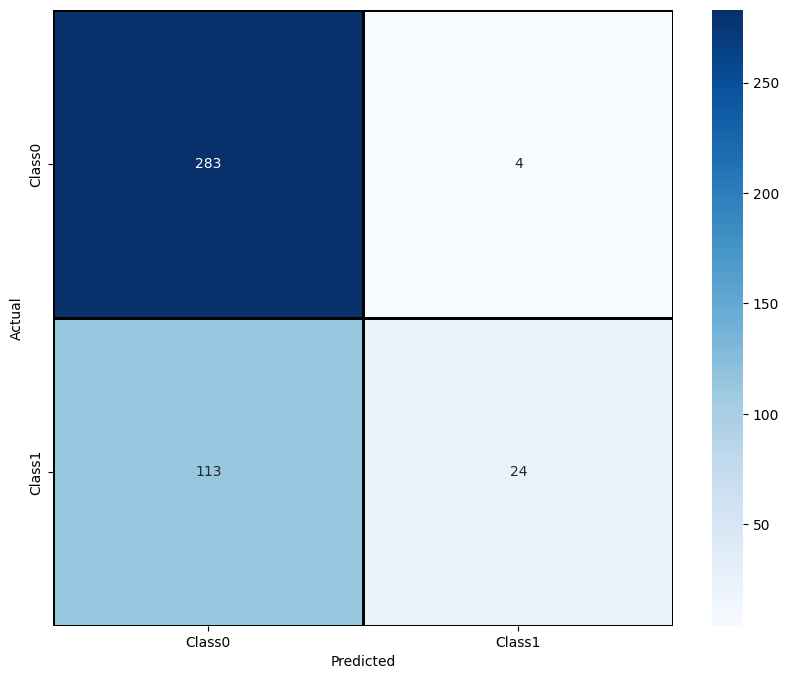

In [33]:
labels = ['Class0', 'Class1']

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix 

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (10,8))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black', 
            linewidth = 1, 
            annot = True, 
            fmt='', 
            xticklabels = labels, 
            yticklabels = labels)

plt.xlabel("Predicted")
plt.ylabel("Actual")

'''Questo codice importa la libreria Scikit-Learn e utilizza la classe MultinomialNB per creare un classificatore Bayesiano Naive con una distribuzione 
multinomiale. Il classificatore viene addestrato sui dati di addestramento (X_train, y_train) utilizzando il metodo fit().
Un classificatore bayesiano naive è un algoritmo di apprendimento automatico che funziona sulla base del teorema di Bayes per classificare gli oggetti in base 
alle loro caratteristiche. "Naive" si riferisce al fatto che l'algoritmo assume che ogni caratteristica sia indipendente dalle altre, anche se questo non è 
sempre il caso. Il classificatore opera sulla base della probabilità condizionata, ovvero la probabilità che un oggetto appartenga a una certa classe, dato un
insieme di caratteristiche. L'algoritmo costruisce il modello di classificazione basandosi su un insieme di dati di addestramento in cui sono noti i valori 
delle caratteristiche e le relative classificazioni. Quando ha bisogno di classificare un nuovo oggetto, l'algoritmo utilizza il modello per calcolare la
probabilità condizionata di appartenenza delle caratteristiche dell'oggetto alle varie classi possibili e sceglie la classe con la probabilità più alta come
la classe di appartenenza dell'oggetto.'''

In [34]:
# accuracy score on the test data
from sklearn.linear_model import SGDClassifier

classifier = SGDClassifier(loss='log', penalty='l2',alpha=1e-3, random_state=667, max_iter=5, tol=None)
classifier.fit(X_train, y_train) 

y_pred = classifier.predict(X_test)
test_data_accuracy = accuracy_score(y_test,y_pred)
test_data_accuracy

'''Il codice sopra definisce un classificatore `SGDClassifier` che utilizza la regressione logistica come funzione di perdita (`loss='log'`). Viene utilizzata
la regolarizzazione L2 (`penalty='l2'`) e viene specificato un parametro di regolarizzazione `alpha=1e-3`. Infine, viene impostato il parametro `random_state`
a 667, il numero massimo di iterazioni a 5 e `tol` a `None`.
Successivamente, il classificatore viene addestrato sui dati di addestramento forniti (`X_train`) e le loro etichette (`y_train`) utilizzando il metodo `fit()`.
Dopodiché, viene utilizzato il classificatore addestrato per fare predizioni sui dati di test (`X_test`) tramite il metodo `predict()`. Le predizioni
risultanti sono memorizzate nella variabile `y_pred`.
Infine, viene calcolata la precisione del modello sui dati di test utilizzando la funzione `accuracy_score()` fornendo come parametri le etichette reali del
test (`y_test`) e le predizioni del modello (`y_pred`). Il risultato viene stampato come "Accuracy score of the test data: " seguito dal punteggio di 
precisione del test.'''

0.6768867924528302

In [35]:
# Step 8: Pipeline Finale (nuovo train test split su dati raw tetuali)
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3, 
                                                    random_state=667
                                                    )


from sklearn.pipeline import Pipeline

bow = CountVectorizer(stop_words='english')
tfidf = TfidfTransformer()
clf = classifier = MultinomialNB(alpha=0.1)

pipe = Pipeline([
                ('bow',bow),
                ('tfidf',tfidf),
                ('clf',clf),
                ])

pipe.fit(X_train, y_train)

y_pred = pipe.predict(X_test)

test_data_accuracy = accuracy_score(y_test,y_pred)
print('Accuracy score of the test data : ', test_data_accuracy)

Accuracy score of the test data :  0.714622641509434


In [36]:
from sklearn.metrics import classification_report
#labels = ['class1', 'class2']
print(classification_report(y_test, y_pred, target_names=labels))

              precision    recall  f1-score   support

      Class0       0.71      0.99      0.82       287
      Class1       0.90      0.13      0.23       137

    accuracy                           0.71       424
   macro avg       0.80      0.56      0.53       424
weighted avg       0.77      0.71      0.63       424



Text(95.72222222222221, 0.5, 'Actual')

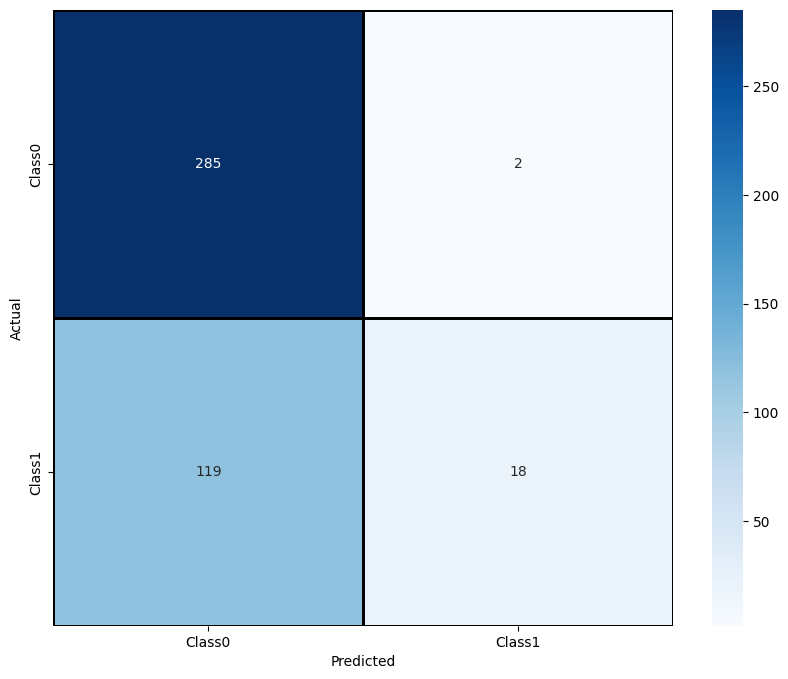

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix 

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (10,8))
sns.heatmap(cm,cmap= "Blues", 
            linecolor = 'black', 
            linewidth = 1, 
            annot = True, 
            fmt='', 
            xticklabels = labels, 
            yticklabels = labels)

plt.xlabel("Predicted")
plt.ylabel("Actual")

In [38]:
# Step 10: Cross Validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(pipe, X, y, scoring = 'f1_micro', cv = 8)

print(f'scores={scores}')
print(f'mean={np.mean(scores)}')
print(f'std={np.std(scores)}')

scores=[0.75706215 0.71186441 0.75141243 0.71186441 0.76836158 0.74431818
 0.74431818 0.73863636]
mean=0.7409797123780175
std=0.01884289369860785


In [39]:
import joblib
joblib.dump(pipe,'NLPes0.pkl')

['NLPes0.pkl']

In [40]:
import joblib

uploaded_model = joblib.load('NLPes0.pkl')
pred = uploaded_model.predict(['very beautiful']) # 1 --> Diabetic
pred[0]

0